# Eval similarity metrics

In [5]:
%matplotlib inline
import pickle
from os import listdir, makedirs
from os.path import join, isfile, exists, dirname
import gc
import re
import math

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns
%pylab inline
import numpy as np
import pandas as pd
from gensim.corpora import Dictionary, MmCorpus
from gensim.models import TfidfModel, LdaModel
from gensim.models import Word2Vec, Doc2Vec, FastText
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel
from tqdm._tqdm_notebook import tqdm_notebook

from constants import *
from utils import load, init_logging, tprint, TopicsLoader
from topic_reranking import Reranker

#from eval_lda import eval_coherence

tqdm_notebook.pandas()
pd.options.display.max_columns = 30
pd.options.display.max_rows = 2000

Populating the interactive namespace from numpy and matplotlib


In [6]:
dfs = [load('dewac1', 'scores'), load('dewiki', 'scores'), load('E', 'scores'), load('FA', 'scores'), load('FO', 'scores'), load('N', 'scores'), load('P', 'scores'), load('O', 'scores'), load('S', 'scores')]
s = pd.concat(dfs)
s = s.replace([np.inf, -np.inf], np.nan)
s[['jcn', 'jcn_ignr_unkwn']] *= -1
col_mean = s.mean()
col_stdv = s.std()
col_mean, col_stdv
inds = np.where(np.isnan(s.values))
s.values[inds] = np.take(col_mean.values, inds[1])

Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac1_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewac1_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewiki_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/dewiki_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/Europarl_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/Europarl_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FAZ_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FAZ_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FOCUS_noun_bow_topic-scores.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/FOCUS_noun_bow_topic-scores_germanet.csv
Reading ../data/preprocessed/LDAmodel/noun/bow/topics/news_noun_bow_topic-scores.csv
Read

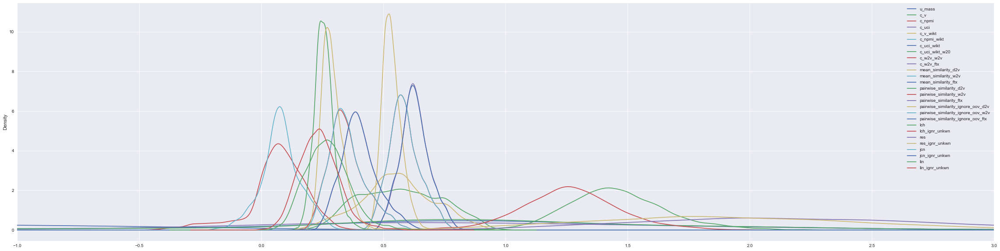

In [9]:
sns.set()
pylab.rcParams['figure.figsize'] = (40, 10)
s.plot(kind='density', xlim=(-1, 3))

In [10]:
s_norm = (s - col_mean) / col_stdv
s_norm

u_mass        c_v  \
dataset             param_id nb_topics topic_idx                      
dewac1              a42      10        0           0.515  3.015e-01   
                                       1           0.232 -1.337e-01   
                                       2           0.573 -3.587e-02   
                                       3           0.614  1.084e+00   
                                       4           0.439 -3.746e-01   
                                       5           0.534  1.151e-02   
                                       6           0.416  2.268e-02   
                                       7           0.455 -2.888e-01   
                                       8           0.490 -7.432e-01   
                                       9           0.547  1.817e+00   
                             25        0           0.342  2.112e-01   
                                       1           0.553 -2.428e-01   
                                       2           0.322  8.233e-01   
                                       3           0.494  1.193e+00   
                                       4           0.461 -1.622e-01   
                                       5           0.513  3.918e-01   
                                       6           0.579  6.221e-01   
                                       7           0.422  8.207e-01   
                                       8           0.220  9.210e-02   
                                       9           0.521  1.788e+00   
                                       10          0.441  5.767e-01   
                                       11          0.272  9.494e-01   
                                       12          0.105 -1.939e-01   
                                       13          0.507 -4.764e-01   
                                       14          0.454  3.866e-02   
                                       15          0.389 -3.678e-01   
                                       16          0.514 -6.818e-01   
                                       17          0.565  1.577e+00   
                                       18          0.428 -2.102e-03   
                                       19          0.458 -5.325e-02   
                                       20          0.437  9.892e-01   
                                       21          0.265  3.667e-01   
                                       22          0.537 -1.757e-01   
                                       23          0.388  1.104e-01   
                                       24          0.313 -6.025e-01   
                             50        0           0.237  2.457e-01   
                                       1           0.386  6.863e-01   
                                       2           0.473  6.769e-01   
                                       3           0.378  8.151e-01   
                                       4           0.240  3.151e-01   
                                       5           0.439  5.507e-01   
                                       6           0.551  6.559e-01   
                                       7           0.320  1.167e+00   
                                       8           0.354  1.745e-01   
                                       9           0.297 -5.808e-01   
                                       10          0.438  6.036e-01   
                                       11         -0.122  9.387e-01   
                                       12          0.312  1.019e+00   
                                       13          0.164  7.596e-01   
                                       14          0.423  4.339e-01   
                                       15          0.151  9.783e-02   
                                       16          0.424 -3.327e-01   
                                       17          0.391  3.177e-01   
                                       18          0.428 -6.137e-03   
                                       19          0.176 -3.547e-01   
   

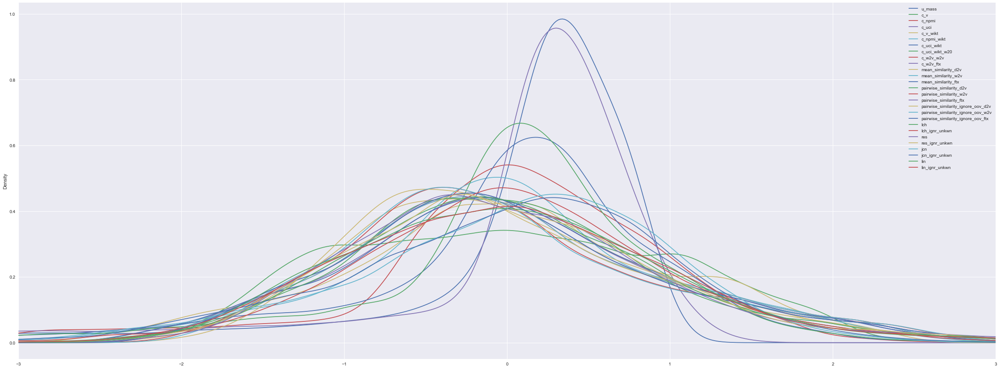

In [11]:
sns.set()
pylab.rcParams['figure.figsize'] = (40, 15)

mu = 0
variance = 1
sigma = math.sqrt(variance)
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
#plt.plot(x,mlab.normpdf(x, mu, sigma))
s_norm.plot.density(xlim=(-3, 3))

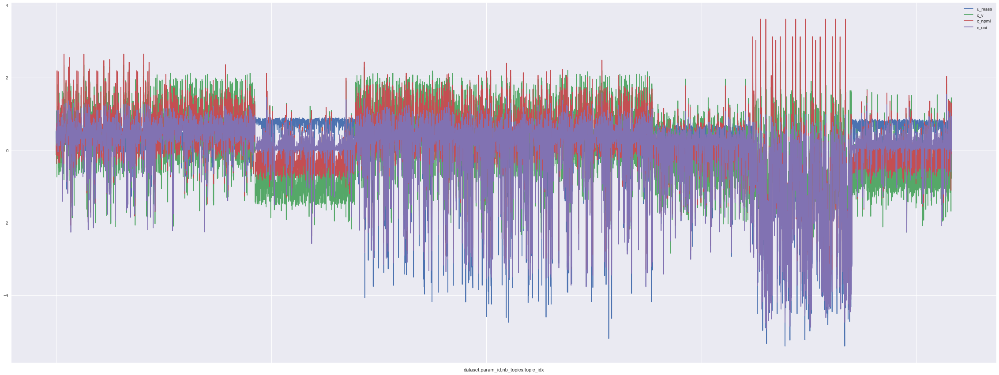

In [12]:
s_norm.loc[:, 'u_mass':'c_uci'].plot()

<Figure size 2880x1080 with 0 Axes>

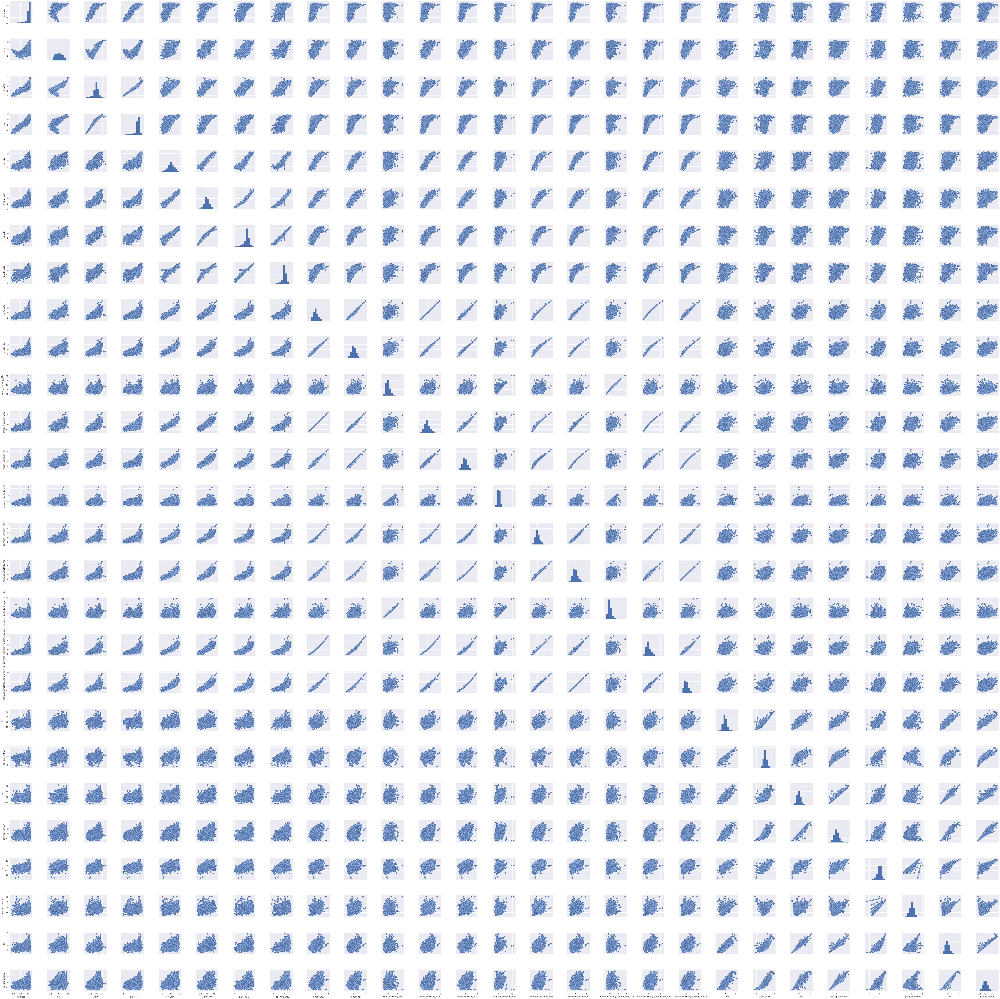

In [26]:
plt.tight_layout()
sns.pairplot(s_norm)

In [13]:
pearson = s.corr(method='pearson')
print(pearson.mean().sort_values(ascending=False))
pearson

mean_similarity_ftx                   0.679
c_w2v_ftx                             0.678
pairwise_similarity_ignore_oov_ftx    0.675
pairwise_similarity_ftx               0.675
c_w2v_w2v                             0.671
mean_similarity_w2v                   0.671
pairwise_similarity_w2v               0.667
pairwise_similarity_ignore_oov_w2v    0.664
c_npmi_wikt                           0.652
c_v_wikt                              0.646
c_uci_wikt                            0.619
c_uci_wikt_w20                        0.603
c_npmi                                0.575
c_uci                                 0.551
c_v                                   0.532
lin_ignr_unkwn                        0.518
lin                                   0.517
res_ignr_unkwn                        0.506
res                                   0.491
u_mass                                0.430
jcn                                   0.428
lch                                   0.405
lch_ignr_unkwn                  

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.366,0.717,0.889,0.532,0.565,0.690,0.658,0.430,0.475,0.168,0.430,0.479,0.277,0.405,0.447,0.151,0.394,0.447,0.134,0.240,0.128,0.183,0.490,0.360,0.263,0.299
c_v,0.366,1.000,0.854,0.678,0.775,0.758,0.677,0.664,0.727,0.688,0.277,0.727,0.689,0.226,0.726,0.691,0.268,0.726,0.691,0.228,0.236,0.355,0.367,0.182,0.142,0.317,0.321
c_npmi,0.717,0.854,1.000,0.931,0.785,0.805,0.792,0.769,0.719,0.705,0.298,0.719,0.707,0.295,0.704,0.693,0.284,0.701,0.693,0.212,0.255,0.320,0.346,0.302,0.228,0.334,0.348
c_uci,0.889,0.678,0.931,1.000,0.721,0.746,0.805,0.775,0.635,0.647,0.228,0.635,0.650,0.317,0.613,0.625,0.211,0.604,0.625,0.209,0.289,0.266,0.311,0.434,0.326,0.343,0.371
c_v_wikt,0.532,0.775,0.785,0.721,1.000,0.965,0.894,0.880,0.916,0.892,0.372,0.916,0.899,0.378,0.913,0.892,0.356,0.904,0.892,0.227,0.257,0.396,0.417,0.283,0.219,0.379,0.389
c_npmi_wikt,0.565,0.758,0.805,0.746,0.965,1.000,0.951,0.930,0.894,0.879,0.399,0.894,0.883,0.387,0.889,0.876,0.382,0.883,0.876,0.243,0.267,0.392,0.411,0.308,0.244,0.381,0.388
c_uci_wikt,0.690,0.677,0.792,0.805,0.894,0.951,1.000,0.975,0.778,0.788,0.350,0.778,0.794,0.376,0.765,0.775,0.331,0.755,0.775,0.235,0.296,0.330,0.366,0.401,0.297,0.367,0.388
c_uci_wikt_w20,0.658,0.664,0.769,0.775,0.880,0.930,0.975,1.000,0.761,0.767,0.354,0.761,0.771,0.357,0.745,0.753,0.336,0.739,0.753,0.223,0.278,0.326,0.359,0.365,0.264,0.350,0.368
c_w2v_w2v,0.430,0.727,0.719,0.635,0.916,0.894,0.778,0.761,1.000,0.979,0.394,1.000,0.977,0.423,0.993,0.978,0.380,0.996,0.978,0.336,0.323,0.479,0.486,0.309,0.293,0.462,0.460
c_w2v_ftx,0.475,0.688,0.705,0.647,0.892,0.879,0.788,0.767,0.979,1.000,0.424,0.979,0.997,0.445,0.971,0.995,0.407,0.974,0.995,0.344,0.347,0.466,0.482,0.365,0.332,0.474,0.479


In [14]:
kendall = s.corr(method='kendall')
print(kendall.mean().sort_values(ascending=False))
kendall

pairwise_similarity_ftx               0.551
pairwise_similarity_ignore_oov_ftx    0.551
mean_similarity_ftx                   0.550
pairwise_similarity_w2v               0.549
c_w2v_ftx                             0.549
c_w2v_w2v                             0.548
mean_similarity_w2v                   0.548
pairwise_similarity_ignore_oov_w2v    0.548
c_npmi_wikt                           0.512
c_v_wikt                              0.508
c_uci_wikt                            0.485
c_uci_wikt_w20                        0.475
c_uci                                 0.432
c_npmi                                0.430
c_v                                   0.399
lin_ignr_unkwn                        0.384
lin                                   0.381
res_ignr_unkwn                        0.366
res                                   0.355
jcn                                   0.297
lch_ignr_unkwn                        0.291
lch                                   0.283
jcn_ignr_unkwn                  

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.028,0.110,0.163,0.167,0.192,0.234,0.212,0.129,0.179,0.122,0.129,0.178,0.147,0.132,0.179,0.119,0.130,0.179,-0.010,0.019,-0.038,-0.021,0.244,0.213,0.065,0.075
c_v,0.028,1.000,0.812,0.735,0.593,0.575,0.533,0.531,0.531,0.489,0.165,0.531,0.491,0.152,0.532,0.492,0.159,0.531,0.492,0.155,0.170,0.236,0.247,0.092,0.074,0.213,0.219
c_npmi,0.110,0.812,1.000,0.866,0.618,0.631,0.590,0.582,0.557,0.521,0.197,0.557,0.524,0.188,0.558,0.525,0.188,0.557,0.525,0.157,0.176,0.241,0.254,0.114,0.092,0.226,0.233
c_uci,0.163,0.735,0.866,1.000,0.605,0.622,0.613,0.592,0.547,0.525,0.186,0.547,0.527,0.206,0.549,0.528,0.177,0.546,0.528,0.168,0.191,0.228,0.245,0.161,0.130,0.234,0.245
c_v_wikt,0.167,0.593,0.618,0.605,1.000,0.858,0.783,0.796,0.763,0.712,0.260,0.763,0.720,0.255,0.776,0.722,0.251,0.764,0.722,0.132,0.152,0.257,0.269,0.147,0.131,0.248,0.253
c_npmi_wikt,0.192,0.575,0.631,0.622,0.858,1.000,0.879,0.854,0.737,0.699,0.276,0.737,0.706,0.269,0.747,0.709,0.267,0.738,0.709,0.142,0.163,0.250,0.263,0.162,0.144,0.247,0.253
c_uci_wikt,0.234,0.533,0.590,0.613,0.783,0.879,1.000,0.906,0.656,0.639,0.275,0.656,0.647,0.270,0.666,0.648,0.267,0.656,0.648,0.129,0.153,0.221,0.237,0.168,0.144,0.229,0.238
c_uci_wikt_w20,0.212,0.531,0.582,0.592,0.796,0.854,0.906,1.000,0.649,0.625,0.285,0.649,0.630,0.261,0.656,0.632,0.277,0.650,0.632,0.117,0.134,0.221,0.233,0.139,0.122,0.218,0.223
c_w2v_w2v,0.129,0.531,0.557,0.547,0.763,0.737,0.656,0.649,1.000,0.864,0.260,1.000,0.860,0.283,0.960,0.862,0.251,0.975,0.862,0.202,0.218,0.302,0.312,0.211,0.201,0.306,0.309
c_w2v_ftx,0.179,0.489,0.521,0.525,0.712,0.699,0.639,0.625,0.864,1.000,0.286,0.864,0.988,0.303,0.855,0.973,0.276,0.863,0.973,0.211,0.234,0.299,0.314,0.249,0.230,0.317,0.324


In [15]:
spearman = s.corr(method='spearman')
print(spearman.mean().sort_values(ascending=False))
spearman

pairwise_similarity_ftx               0.670
pairwise_similarity_ignore_oov_ftx    0.670
mean_similarity_ftx                   0.669
c_w2v_ftx                             0.668
pairwise_similarity_w2v               0.665
mean_similarity_w2v                   0.664
c_w2v_w2v                             0.664
pairwise_similarity_ignore_oov_w2v    0.664
c_npmi_wikt                           0.639
c_v_wikt                              0.635
c_uci_wikt                            0.614
c_uci_wikt_w20                        0.603
c_uci                                 0.561
c_npmi                                0.553
c_v                                   0.523
lin_ignr_unkwn                        0.503
lin                                   0.500
res_ignr_unkwn                        0.482
res                                   0.469
jcn                                   0.397
lch_ignr_unkwn                        0.387
lch                                   0.375
pairwise_similarity_d2v         

,u_mass,c_v,c_npmi,c_uci,c_v_wikt,c_npmi_wikt,c_uci_wikt,c_uci_wikt_w20,c_w2v_w2v,c_w2v_ftx,mean_similarity_d2v,mean_similarity_w2v,mean_similarity_ftx,pairwise_similarity_d2v,pairwise_similarity_w2v,pairwise_similarity_ftx,pairwise_similarity_ignore_oov_d2v,pairwise_similarity_ignore_oov_w2v,pairwise_similarity_ignore_oov_ftx,lch,lch_ignr_unkwn,res,res_ignr_unkwn,jcn,jcn_ignr_unkwn,lin,lin_ignr_unkwn
u_mass,1.000,0.052,0.175,0.263,0.253,0.290,0.349,0.318,0.202,0.274,0.185,0.202,0.273,0.223,0.206,0.274,0.179,0.203,0.274,-0.014,0.029,-0.056,-0.030,0.360,0.314,0.094,0.110
c_v,0.052,1.000,0.949,0.898,0.764,0.750,0.705,0.700,0.715,0.669,0.246,0.715,0.672,0.222,0.716,0.672,0.236,0.715,0.672,0.226,0.249,0.344,0.359,0.140,0.113,0.313,0.322
c_npmi,0.175,0.949,1.000,0.965,0.788,0.796,0.757,0.746,0.737,0.699,0.291,0.737,0.702,0.273,0.737,0.703,0.279,0.737,0.703,0.228,0.255,0.349,0.366,0.171,0.139,0.328,0.338
c_uci,0.263,0.898,0.965,1.000,0.780,0.794,0.780,0.759,0.729,0.705,0.274,0.729,0.707,0.298,0.730,0.707,0.262,0.728,0.707,0.243,0.276,0.330,0.354,0.238,0.194,0.341,0.355
c_v_wikt,0.253,0.764,0.788,0.780,1.000,0.971,0.932,0.938,0.923,0.888,0.379,0.923,0.894,0.367,0.932,0.896,0.366,0.924,0.896,0.193,0.220,0.374,0.390,0.219,0.194,0.361,0.369
c_npmi_wikt,0.290,0.750,0.796,0.794,0.971,1.000,0.976,0.965,0.908,0.879,0.401,0.908,0.884,0.386,0.914,0.886,0.388,0.908,0.886,0.208,0.236,0.364,0.381,0.240,0.213,0.360,0.368
c_uci_wikt,0.349,0.705,0.757,0.780,0.932,0.976,1.000,0.978,0.846,0.830,0.398,0.846,0.836,0.385,0.853,0.838,0.385,0.846,0.838,0.188,0.220,0.321,0.342,0.250,0.213,0.332,0.344
c_uci_wikt_w20,0.318,0.700,0.746,0.759,0.938,0.965,0.978,1.000,0.838,0.816,0.411,0.838,0.821,0.374,0.845,0.823,0.400,0.839,0.823,0.170,0.193,0.322,0.338,0.210,0.182,0.317,0.325
c_w2v_w2v,0.202,0.715,0.737,0.729,0.923,0.908,0.846,0.838,1.000,0.974,0.380,1.000,0.971,0.407,0.995,0.972,0.367,0.999,0.972,0.297,0.319,0.436,0.450,0.309,0.294,0.444,0.448
c_w2v_ftx,0.274,0.669,0.699,0.705,0.888,0.879,0.830,0.816,0.974,1.000,0.415,0.974,0.997,0.434,0.969,0.997,0.402,0.973,0.997,0.309,0.341,0.431,0.451,0.359,0.334,0.458,0.468


-----

#### trying to make a fair comparison

In [7]:
s_fair = s.drop(['c_uci', 'c_uci_wikt', 'c_uci_wikt_w20', 'c_w2v_w2v', 'mean_similarity_d2v', 'mean_similarity_w2v', 'mean_similarity_ftx', 'pairwise_similarity_ignore_oov_d2v', 'pairwise_similarity_ignore_oov_w2v', 'pairwise_similarity_w2v', 'pairwise_similarity_ignore_oov_ftx', 'lch', 'res', 'jcn', 'lin'], axis=1)
s_fair

u_mass    c_v     c_npmi  \
dataset             param_id nb_topics topic_idx                             
dewac1              a42      10        0          -1.306  0.622  8.393e-02   
                                       1          -2.189  0.549  6.608e-02   
                                       2          -1.125  0.566  6.245e-02   
                                       3          -0.997  0.751  1.592e-01   
                                       4          -1.542  0.510  5.192e-02   
                                       5          -1.247  0.574  1.072e-01   
                                       6          -1.615  0.575  6.932e-02   
                                       7          -1.493  0.524  5.275e-02   
                                       8          -1.385  0.449  2.134e-02   
                                       9          -1.206  0.873  3.400e-01   
                             25        0          -1.845  0.607  7.167e-02   
                                       1          -1.189  0.531  4.794e-02   
                                       2          -1.907  0.708  1.533e-01   
                                       3          -1.371  0.769  1.905e-01   
                                       4          -1.473  0.545  8.644e-02   
                                       5          -1.313  0.637  1.345e-01   
                                       6          -1.108  0.675  1.257e-01   
                                       7          -1.595  0.708  1.450e-01   
                                       8          -2.226  0.587  6.001e-02   
                                       9          -1.287  0.868  3.368e-01   
                                       10         -1.536  0.667  1.443e-01   
                                       11         -2.064  0.729  1.596e-01   
                                       12         -2.583  0.540  6.956e-02   
                                       13         -1.330  0.493  3.913e-02   
                                       14         -1.496  0.578  7.299e-02   
                                       15         -1.700  0.511  3.864e-02   
                                       16         -1.309  0.459  2.499e-02   
                                       17         -1.151  0.833  2.296e-01   
                                       18         -1.578  0.571  6.747e-02   
                                       19         -1.485  0.563  5.440e-02   
                                       20         -1.548  0.735  1.483e-01   
                                       21         -2.086  0.632  1.176e-01   
                                       22         -1.239  0.543  5.279e-02   
                                       23         -1.703  0.590  9.533e-02   
                                       24         -1.935  0.472  2.348e-02   
                             50        0          -2.172  0.612  8.004e-02   
                                       1          -1.708  0.685  1.311e-01   
                                       2          -1.438  0.684  1.683e-01   
                                       3          -1.732  0.707  1.434e-01   
                                       4          -2.162  0.624  1.068e-01   
                                       5          -1.542  0.663  1.464e-01   
                                       6          -1.193  0.680  1.307e-01   
                                       7          -1.913  0.765  1.975e-01   
                                       8          -1.807  0.601  7.987e-02   
                                       9          -1.986  0.475  6.556e-02   
                                       10         -1.546  0.672  1.260e-01   
                                       11         -3.291  0.727  1.873e-01   
                                       12         -1.940  0.740  2.214e-01   
                                       13         -2.401  0.697  1.445e-01   
                                       14         -1.592  0.643  1.105e-

In [28]:
pearson_f = s_fair.corr(method='pearson')
print(pearson_f.mean().sort_values(ascending=False))
pearson_f

c_w2v_ftx                  0.643
pairwise_similarity_ftx    0.640
c_npmi_wikt                0.629
c_v_wikt                   0.625
c_npmi                     0.586
c_v                        0.535
lin_ignr_unkwn             0.533
res_ignr_unkwn             0.510
u_mass                     0.455
lch_ignr_unkwn             0.429
jcn_ignr_unkwn             0.387
pairwise_similarity_d2v    0.367
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.366,0.717,0.532,0.565,0.475,0.277,0.447,0.240,0.183,0.360,0.299
c_v,0.366,1.000,0.854,0.775,0.758,0.688,0.226,0.691,0.236,0.367,0.142,0.321
c_npmi,0.717,0.854,1.000,0.785,0.805,0.705,0.295,0.693,0.255,0.346,0.228,0.348
c_v_wikt,0.532,0.775,0.785,1.000,0.965,0.892,0.378,0.892,0.257,0.417,0.219,0.389
c_npmi_wikt,0.565,0.758,0.805,0.965,1.000,0.879,0.387,0.876,0.267,0.411,0.244,0.388
c_w2v_ftx,0.475,0.688,0.705,0.892,0.879,1.000,0.445,0.995,0.347,0.482,0.332,0.479
pairwise_similarity_d2v,0.277,0.226,0.295,0.378,0.387,0.445,1.000,0.443,0.205,0.261,0.222,0.268
pairwise_similarity_ftx,0.447,0.691,0.693,0.892,0.876,0.995,0.443,1.000,0.349,0.490,0.323,0.480
lch_ignr_unkwn,0.240,0.236,0.255,0.257,0.267,0.347,0.205,0.349,1.000,0.747,0.430,0.808
res_ignr_unkwn,0.183,0.367,0.346,0.417,0.411,0.482,0.261,0.490,0.747,1.000,0.472,0.938


In [29]:
kendall_f = s_fair.corr(method='kendall')
print(kendall_f.mean().sort_values(ascending=False))
kendall_f

pairwise_similarity_ftx    0.501
c_w2v_ftx                  0.498
c_npmi_wikt                0.480
c_v_wikt                   0.477
c_npmi                     0.430
c_v                        0.404
lin_ignr_unkwn             0.399
res_ignr_unkwn             0.373
lch_ignr_unkwn             0.314
jcn_ignr_unkwn             0.292
pairwise_similarity_d2v    0.275
u_mass                     0.191
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.028,0.110,0.167,0.192,0.179,0.147,0.179,0.019,-0.021,0.213,0.075
c_v,0.028,1.000,0.812,0.593,0.575,0.489,0.152,0.492,0.170,0.247,0.074,0.219
c_npmi,0.110,0.812,1.000,0.618,0.631,0.521,0.188,0.525,0.176,0.254,0.092,0.233
c_v_wikt,0.167,0.593,0.618,1.000,0.858,0.712,0.255,0.722,0.152,0.269,0.131,0.253
c_npmi_wikt,0.192,0.575,0.631,0.858,1.000,0.699,0.269,0.709,0.163,0.263,0.144,0.253
c_w2v_ftx,0.179,0.489,0.521,0.712,0.699,1.000,0.303,0.973,0.234,0.314,0.230,0.324
pairwise_similarity_d2v,0.147,0.152,0.188,0.255,0.269,0.303,1.000,0.305,0.145,0.183,0.156,0.201
pairwise_similarity_ftx,0.179,0.492,0.525,0.722,0.709,0.973,0.305,1.000,0.235,0.315,0.230,0.325
lch_ignr_unkwn,0.019,0.170,0.176,0.152,0.163,0.234,0.145,0.235,1.000,0.526,0.365,0.589
res_ignr_unkwn,-0.021,0.247,0.254,0.269,0.263,0.314,0.183,0.315,0.526,1.000,0.342,0.785


In [30]:
spearman_f = s_fair.corr(method='spearman')
print(spearman_f.mean().sort_values(ascending=False))
spearman_f

pairwise_similarity_ftx    0.622
c_w2v_ftx                  0.619
c_npmi_wikt                0.596
c_v_wikt                   0.592
c_npmi                     0.540
lin_ignr_unkwn             0.513
c_v                        0.510
res_ignr_unkwn             0.481
lch_ignr_unkwn             0.407
jcn_ignr_unkwn             0.381
pairwise_similarity_d2v    0.363
u_mass                     0.247
dtype: float64


,u_mass,c_v,c_npmi,c_v_wikt,c_npmi_wikt,c_w2v_ftx,pairwise_similarity_d2v,pairwise_similarity_ftx,lch_ignr_unkwn,res_ignr_unkwn,jcn_ignr_unkwn,lin_ignr_unkwn
u_mass,1.000,0.052,0.175,0.253,0.290,0.274,0.223,0.274,0.029,-0.030,0.314,0.110
c_v,0.052,1.000,0.949,0.764,0.750,0.669,0.222,0.672,0.249,0.359,0.113,0.322
c_npmi,0.175,0.949,1.000,0.788,0.796,0.699,0.273,0.703,0.255,0.366,0.139,0.338
c_v_wikt,0.253,0.764,0.788,1.000,0.971,0.888,0.367,0.896,0.220,0.390,0.194,0.369
c_npmi_wikt,0.290,0.750,0.796,0.971,1.000,0.879,0.386,0.886,0.236,0.381,0.213,0.368
c_w2v_ftx,0.274,0.669,0.699,0.888,0.879,1.000,0.434,0.997,0.341,0.451,0.334,0.468
pairwise_similarity_d2v,0.223,0.222,0.273,0.367,0.386,0.434,1.000,0.436,0.214,0.270,0.231,0.297
pairwise_similarity_ftx,0.274,0.672,0.703,0.896,0.886,0.997,0.436,1.000,0.341,0.452,0.333,0.469
lch_ignr_unkwn,0.029,0.249,0.255,0.220,0.236,0.341,0.214,0.341,1.000,0.713,0.509,0.779
res_ignr_unkwn,-0.030,0.359,0.366,0.390,0.381,0.451,0.270,0.452,0.713,1.000,0.488,0.937


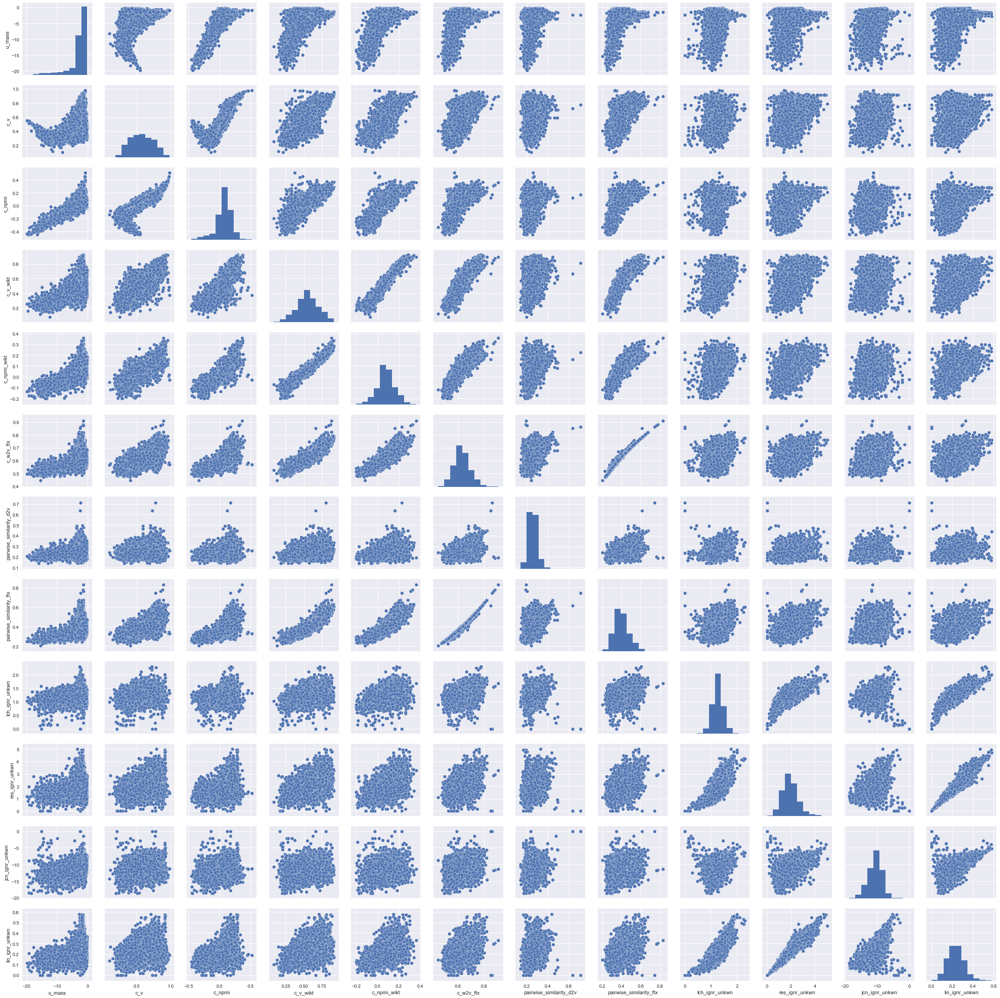

In [31]:
sns.pairplot(s_fair)

In [ ]:
from nipype.algorithms.icc import ICC_rep_anova

ICC_rep_anova(s_fair.values.T)

In [ ]:
names = ['Word1', 'Word2', 'Gold', 'Pos1', 'Pos2']
def gur(size):
    return (
        pd
        .read_csv(join(DATA_BASE, 'gurevych_datasets', f'wortpaare{size}.gold.pos.txt'), sep=':', names=names, comment='#')
        .assign(Dataset=f'gur{size}')
        .set_index('Dataset', append=True)
    )

df = pd.concat([gur(350), gur(222), gur(65)])
#df.to_csv(join(ETL_PATH, 'gurevych_datasets.csv'))
df